## Assignment 3 : Classifying banking Crisis
-------------------------------------------------------------------------------------------------------------------
### What was the Rationale Behind the chosen model?

The problem was a binary classification problem based on time. Using Binary Classifiers was the intuition, so I checked with 5 models, but the evaluation metric in check was the F1 score and ROC curve. 

The ROC curve and F1 score had best to capture the sense of specificity and senstivity in the data, and were better metrics that accuracy because, the cost of a false negative in our case was a lot. We do not want to leave an unidentified impending financial crisis which will lead to complacency, and no preempting of the crisis, as people in that economy might suffer to death. 

-------------------------------------------------------------------------------------------------------------------


### What more could we do, if we had more time and resources?: 

 1. I would have tried Bayesian Regression Modelling techniques to model for the variation in the data per year. 
 2. I would have tried to find more data, because here we had a country coverage of 70 countries, and time coverage from _1980 to 2014_. 
3. I would have given a shot to approach 2, as you will read further in the report, but, only if I had an expert to give me context and subject matter expertise. 

-------------------------------------------------------------------------------------------------------------------
#### The reasons behind the decisions made our given every step of the way in this file. 
-------------------------------------------------------------------------------------------------------------------

#### Here are some takeaways: 
#### No high correlation between numerical features
Please have a look at the heatmap 
#### Limited country and yearly coverage, on combined dataset
On further exploring the labels data, I found out that it does not have labels for 2015, and 2016, and does not have any labels for 'Ireland'.It essentially covers the declaration of financial crisis from years _1980 to 2014_. 

This means that the country coverage for the binary indicator of banking crisis is not the same as the country coverage for the features. We had 2 approaches from this point : 1) dropping all the unlabeled countries 
and 2) use semi-supervised learning to perform Label Propogation and add synthetic labels to the dataset. 

Approach 2 will lead us to getting results for all of the countries covered by the features, but the results will be less accurate, as the labels will be generated by an algorithm and will not take any causal effects into account, therefore we won't be able to vouch. 
*False negatives* produced by this approach would do so much harm to an economy, because in case of an impending crisis, there would be no room to pre-empt it and help the economy by framing policies and planning aid measures for them. -> *It can lead to biased an misleading results*.
We will go with approach 1

#### Missing Value treatment:
We do see a lot of missing values in our balanced label dataset. However, in a scenario like this, where the prediction of banking crisis is under study, under a lot of complex factors, and also *based on countries* to account for the causal effect:

It will not be wise to use traditional impuation techniques like imputation with mean on all observations. Since our data set is small, dropping all the missing values will also lead us to having a biased model or highly innacurate model.

Our missing values here are very context specific, and based on complexed factors as captured by these variables. One possible technique is KNN imputation. It will measure the distance from the K-nearest neighbours and will lead us to have better estimated imputations.

#### Label Imbalance:
Upsampled dataset with resampling to make a balanced dataset. 

#### Feature Engineering: 

#####    1) Built code variable to merge the data properly

#####    2) Right Skewed Numerical Variables: 
Performed log transformation to the data to make it less skewed

#####    3) Standardization and Outlier Detection
The numerical variables are standardized now to give them balance, and it helped in treating outliers too. 

##### 4) Built Dummy Features for Income Strata and Region 
These variables captured the sense of geographical position and income status in the dataset.

#### Time Series Split:
Used time series split to train and evaluate the model in the best way possible and maintain a variety of dates in the model.

#### Model Development:
Built 5 models for binary classification and compared performance in terms of F1 score, accuracy(not a good metric), and ROC curve.

-------------------------------------------------------------------------------------------------------------------


### Importing necessary libraries

In [401]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import resample
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report, RocCurveDisplay, auc, roc_curve
from sklearn.model_selection import cross_val_predict
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from scipy import special, stats
from sklearn.model_selection import TimeSeriesSplit
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

## Reading in Data, Cleaning and Merging it

In [180]:
path = '/Users/sunidhigoyal/Downloads/TakeHomeAssignment_Hybrid/Assignment_Part3_Data.xlsx'

In [181]:
features  = pd.read_excel(path, sheet_name = 'Features')
labels  = pd.read_excel(path, sheet_name = 'Labels')

In [182]:
features

,iso3,iso2,imfn,country,region,income,year,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02
0,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13263,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2017,5.127896,NaN,NaN,50.05430,NaN,38.62361,NaN,NaN,52.71031,33.47981
13264,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2018,5.264899,NaN,NaN,42.80411,NaN,42.85842,NaN,NaN,57.61418,40.10917
13265,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2019,7.479496,NaN,NaN,33.47760,NaN,53.54624,NaN,NaN,54.74979,20.65183
13266,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2020,7.084079,NaN,NaN,36.80099,NaN,60.90977,NaN,NaN,58.96508,17.86878


In [183]:
labels

,iso3,Country,Year,Banking Crisis
0,DZA,Algeria,1980,0.0
1,DZA,Algeria,1981,0.0
2,DZA,Algeria,1982,0.0
3,DZA,Algeria,1983,0.0
4,DZA,Algeria,1984,0.0
...,...,...,...,...
2585,ZWE,Zimbabwe,2012,0.0
2586,ZWE,Zimbabwe,2013,0.0
2587,ZWE,Zimbabwe,2014,0.0
2588,ZWE,Zimbabwe,2015,NaN


In [184]:
features['code'] = features['iso3'] + features['year'].astype(str)
features

,iso3,iso2,imfn,country,region,income,year,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,code
0,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1960
1,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1961
2,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1962
3,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1963
4,ABW,AW,314,Aruba,Latin America & Caribbean,High income,1964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13263,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2017,5.127896,NaN,NaN,50.05430,NaN,38.62361,NaN,NaN,52.71031,33.47981,ZWE2017
13264,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2018,5.264899,NaN,NaN,42.80411,NaN,42.85842,NaN,NaN,57.61418,40.10917,ZWE2018
13265,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2019,7.479496,NaN,NaN,33.47760,NaN,53.54624,NaN,NaN,54.74979,20.65183,ZWE2019
13266,ZWE,ZW,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2020,7.084079,NaN,NaN,36.80099,NaN,60.90977,NaN,NaN,58.96508,17.86878,ZWE2020


#### Cleaning : I later found out that the entries for Hungary in the labels data are inconsistent with those inthe features table, which led to a merged table that would not give a label to the country's Banking Crisis events appropriately. Therefore, making them consistent in the next step. 

In [185]:
labels['iso3'] = labels['iso3'].str.rstrip()

In [186]:
labels['code'] = labels['iso3'] + labels['Year'].astype(str)
labels

,iso3,Country,Year,Banking Crisis,code
0,DZA,Algeria,1980,0.0,DZA1980
1,DZA,Algeria,1981,0.0,DZA1981
2,DZA,Algeria,1982,0.0,DZA1982
3,DZA,Algeria,1983,0.0,DZA1983
4,DZA,Algeria,1984,0.0,DZA1984
...,...,...,...,...,...
2585,ZWE,Zimbabwe,2012,0.0,ZWE2012
2586,ZWE,Zimbabwe,2013,0.0,ZWE2013
2587,ZWE,Zimbabwe,2014,0.0,ZWE2014
2588,ZWE,Zimbabwe,2015,NaN,ZWE2015


In [187]:
labels.columns = ['ISO3', 'Country', 'Year', 'Banking Crisis', 'code']
labels.head()

,ISO3,Country,Year,Banking Crisis,code
0,DZA,Algeria,1980,0.0,DZA1980
1,DZA,Algeria,1981,0.0,DZA1981
2,DZA,Algeria,1982,0.0,DZA1982
3,DZA,Algeria,1983,0.0,DZA1983
4,DZA,Algeria,1984,0.0,DZA1984


In [188]:
df = pd.merge(features, labels, on='code', how='outer')

In [189]:
#these columns are repeated and redundant -> dropping them 
df = df.drop(['Country', 'Year', 'iso2'], axis = 1)
#dropping imfn because it serves the same purpose as iso3
df = df.drop(['imfn'], axis = 1)

In [190]:
df

,iso3,imfn,country,region,income,year,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,code,ISO3,Banking Crisis
0,ABW,314,Aruba,Latin America & Caribbean,High income,1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1960,NaN,NaN
1,ABW,314,Aruba,Latin America & Caribbean,High income,1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1961,NaN,NaN
2,ABW,314,Aruba,Latin America & Caribbean,High income,1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1962,NaN,NaN
3,ABW,314,Aruba,Latin America & Caribbean,High income,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1963,NaN,NaN
4,ABW,314,Aruba,Latin America & Caribbean,High income,1964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1964,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13263,ZWE,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2017,5.127896,NaN,NaN,50.05430,NaN,38.62361,NaN,NaN,52.71031,33.47981,ZWE2017,NaN,NaN
13264,ZWE,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2018,5.264899,NaN,NaN,42.80411,NaN,42.85842,NaN,NaN,57.61418,40.10917,ZWE2018,NaN,NaN
13265,ZWE,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2019,7.479496,NaN,NaN,33.47760,NaN,53.54624,NaN,NaN,54.74979,20.65183,ZWE2019,NaN,NaN
13266,ZWE,698,Zimbabwe,Sub-Saharan Africa,Lower middle income,2020,7.084079,NaN,NaN,36.80099,NaN,60.90977,NaN,NaN,58.96508,17.86878,ZWE2020,NaN,NaN


#### A country belonging to a particular income strata and region can also be a plausible reason for a financial crisis there. Therefore, dummy encoding the metrics 

In [191]:
columns_to_encode = ['region', 'income']
df = pd.get_dummies(df, columns=columns_to_encode, drop_first=False, dtype=float)

In [197]:
df

,iso3,country,year,si01,si02,si03,si04,si05,si06,si07,...,region_Europe & Central Asia,region_Latin America & Caribbean,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income
0,ABW,Aruba,1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,ABW,Aruba,1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,ABW,Aruba,1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,ABW,Aruba,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,ABW,Aruba,1964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13263,ZWE,Zimbabwe,2017,5.127896,NaN,NaN,50.05430,NaN,38.62361,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13264,ZWE,Zimbabwe,2018,5.264899,NaN,NaN,42.80411,NaN,42.85842,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13265,ZWE,Zimbabwe,2019,7.479496,NaN,NaN,33.47760,NaN,53.54624,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13266,ZWE,Zimbabwe,2020,7.084079,NaN,NaN,36.80099,NaN,60.90977,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [196]:
df.columns

Index(['iso3', 'country', 'year', 'si01', 'si02', 'si03', 'si04', 'si05',
       'si06', 'si07', 'sm01', 'oi01', 'oi02', 'code', 'ISO3',
       'Banking Crisis', 'region_East Asia & Pacific',
       'region_Europe & Central Asia', 'region_Latin America & Caribbean',
       'region_Middle East & North Africa', 'region_North America',
       'region_South Asia', 'region_Sub-Saharan Africa', 'income_High income',
       'income_Low income', 'income_Lower middle income',
       'income_Upper middle income'],
      dtype='object')

In [199]:
df.shape

(13268, 27)

In [169]:
df['Banking Crisis'].value_counts()

Banking Crisis
0.0    1878
1.0     497
Name: count, dtype: int64

In [198]:
df.isna().sum()

iso3                                     0
country                                  0
year                                     0
si01                                  9959
si02                                 10798
si03                                 10881
si04                                  4715
si05                                 10779
si06                                 10020
si07                                 11032
sm01                                 10917
oi01                                  9938
oi02                                  4803
code                                     0
ISO3                                 10678
Banking Crisis                       10893
region_East Asia & Pacific               0
region_Europe & Central Asia             0
region_Latin America & Caribbean         0
region_Middle East & North Africa        0
region_North America                     0
region_South Asia                        0
region_Sub-Saharan Africa                0
income_High

## Data Exploration

In [171]:
numerical_vars = ['si01', 'si02',
       'si03', 'si04', 'si05', 'si06', 'si07', 'sm01', 'oi01', 'oi02']

/Users/sunidhigoyal/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


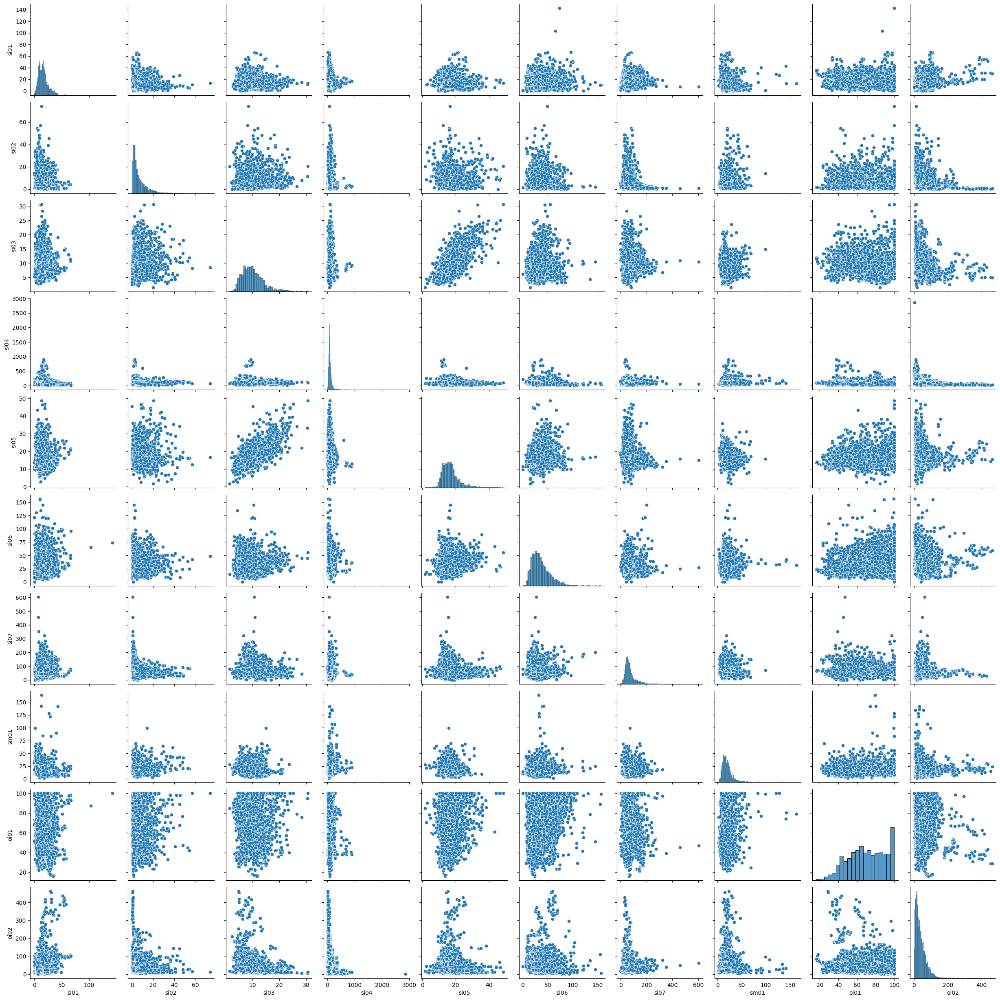

In [172]:
sns.pairplot(df, vars = numerical_vars)

This tells us as the numerical data is mostly skewed right. Therefore transformation would be necessary. 

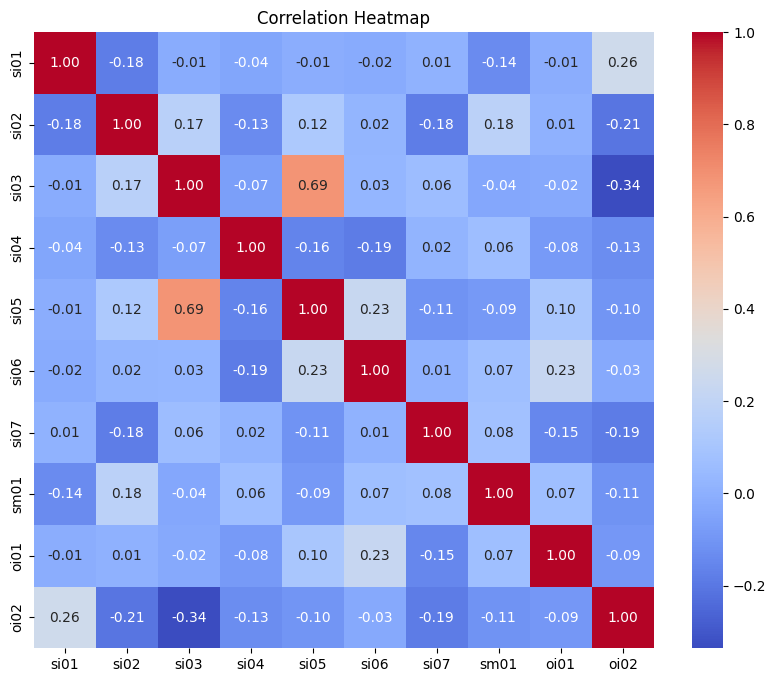

In [142]:
correlation_matrix = df.loc[:,numerical_vars].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

We don't see a high correlation between existing numerical values, that means they all hold a fair chance to contribute to the banking crisis in a country without any redundancies or correlation within themselves -> no dropping of features. 

In [173]:
df.describe(include='all')

,iso3,imfn,country,region,income,year,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,code,ISO3,Banking Crisis
count,13268,13268.000000,13268,13268,13268,13268.000000,3309.000000,2470.000000,2387.000000,8553.000000,2489.000000,3248.000000,2236.000000,2351.000000,3330.000000,8465.000000,13268,2590,2375.000000
unique,214,NaN,214,7,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13268,70,NaN
top,ABW,NaN,Aruba,Europe & Central Asia,High income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ABW1960,AGO,NaN
freq,62,NaN,62,3596,4898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,37,NaN
mean,NaN,576.892523,NaN,NaN,NaN,1990.500000,16.417204,7.064384,10.021953,98.597215,17.008595,36.299220,71.277560,20.650724,70.143445,41.382624,NaN,NaN,0.209263
std,NaN,270.983816,NaN,NaN,NaN,17.896205,9.720101,7.556248,3.958807,73.471641,5.396795,18.752242,42.809765,13.205031,19.719535,40.500557,NaN,NaN,0.406868
min,NaN,111.000000,NaN,NaN,NaN,1960.000000,-0.325974,0.000000,1.490407,5.961548,1.754749,0.379993,0.800000,1.972708,16.144400,0.010706,NaN,NaN,0.000000
25%,NaN,328.000000,NaN,NaN,NaN,1975.000000,9.571144,2.161919,7.193500,64.988740,13.385050,22.781402,45.202939,13.076865,55.275495,15.761810,NaN,NaN,0.000000
50%,NaN,613.000000,NaN,NaN,NaN,1990.500000,14.963360,4.267505,9.500000,86.865160,16.100279,32.385160,60.967763,17.980120,70.383325,31.355960,NaN,NaN,0.000000
75%,NaN,823.000000,NaN,NaN,NaN,2006.000000,20.300350,9.444139,12.175174,115.238900,19.100000,45.865963,82.890138,24.077915,87.006863,54.486750,NaN,NaN,0.000000


In [174]:
pd.isnull(df).any()

iso3              False
imfn              False
country           False
region            False
income            False
year              False
si01               True
si02               True
si03               True
si04               True
si05               True
si06               True
si07               True
sm01               True
oi01               True
oi02               True
code              False
ISO3               True
Banking Crisis     True
dtype: bool

## Country Coverage on Labels

#### On further exploring the labels data, I found out that it does not have labels for 2015, and 2016, and does not have any labels for 'Ireland'.It essentially covers the declaration of financial crisis from years 1980 to 2014. 

In [205]:
labels['Banking Crisis'].isna().sum()

215

### Country Coverage in Labels vs Features

In [175]:
len(labels.ISO3.unique())

70

In [176]:
len(df.iso3.unique())

214

### This means that the country coverage for the binary indicator of banking crisis is not the same as the country coverage for the features.


### We have 2 approaches from this point : 1) dropping all the unlabeled countries 
### and 2) use semi-supervised learning to perform Label Propogation and add synthetic labels to the dataset. 

### Caveats: 

Approach 1 will lead us to more accurate results, because we have a verified source, like the World Bank vouching for the existence of financial crisis in an economy, but it will also restrict us to predict financial crisis for only those economies which we have studied. 


Approach 2 will lead us to getting results for all of the countries covered by the features, but the results will be less accurate, as the labels will be generated by an algorithm and will not take any causal effects into account, therefore we won't be able to vouch. 
*False negatives* produced by this approach would do so much harm to an economy, because in case of an impending crisis, there would be no room to pre-empt it and help the economy by framing policies and planning aid measures for them. -> *It can lead to biased an misleading results*

We will go with approach 1


In [200]:
df

,iso3,country,year,si01,si02,si03,si04,si05,si06,si07,...,region_Europe & Central Asia,region_Latin America & Caribbean,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income
0,ABW,Aruba,1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,ABW,Aruba,1961,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,ABW,Aruba,1962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,ABW,Aruba,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,ABW,Aruba,1964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13263,ZWE,Zimbabwe,2017,5.127896,NaN,NaN,50.05430,NaN,38.62361,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13264,ZWE,Zimbabwe,2018,5.264899,NaN,NaN,42.80411,NaN,42.85842,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13265,ZWE,Zimbabwe,2019,7.479496,NaN,NaN,33.47760,NaN,53.54624,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13266,ZWE,Zimbabwe,2020,7.084079,NaN,NaN,36.80099,NaN,60.90977,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [206]:
df.isna().sum()

iso3                                     0
country                                  0
year                                     0
si01                                  9959
si02                                 10798
si03                                 10881
si04                                  4715
si05                                 10779
si06                                 10020
si07                                 11032
sm01                                 10917
oi01                                  9938
oi02                                  4803
code                                     0
ISO3                                 10678
Banking Crisis                       10893
region_East Asia & Pacific               0
region_Europe & Central Asia             0
region_Latin America & Caribbean         0
region_Middle East & North Africa        0
region_North America                     0
region_South Asia                        0
region_Sub-Saharan Africa                0
income_High

## Approach 1: Dropping Data of Unlabeled Countries and Years

In [207]:
df1 = df.dropna(subset = ['Banking Crisis'])

In [209]:
df1.shape

(2375, 27)

In [212]:
df1 = df1.drop(['code', 'ISO3', 'iso3'],axis=1)

In [213]:
df1

,country,year,si01,si02,si03,si04,si05,si06,si07,sm01,...,region_Europe & Central Asia,region_Latin America & Caribbean,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income
144,Angola,1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
145,Angola,1981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
146,Angola,1982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
147,Angola,1983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
148,Angola,1984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13256,Zimbabwe,2010,4.590675,NaN,NaN,74.61155,NaN,48.23680,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13257,Zimbabwe,2011,5.008511,NaN,NaN,93.14187,NaN,37.63059,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13258,Zimbabwe,2012,5.439702,NaN,NaN,93.83687,NaN,31.13495,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13259,Zimbabwe,2013,5.302338,NaN,NaN,93.88337,NaN,34.71935,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


## Feature Engineering

/Users/sunidhigoyal/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


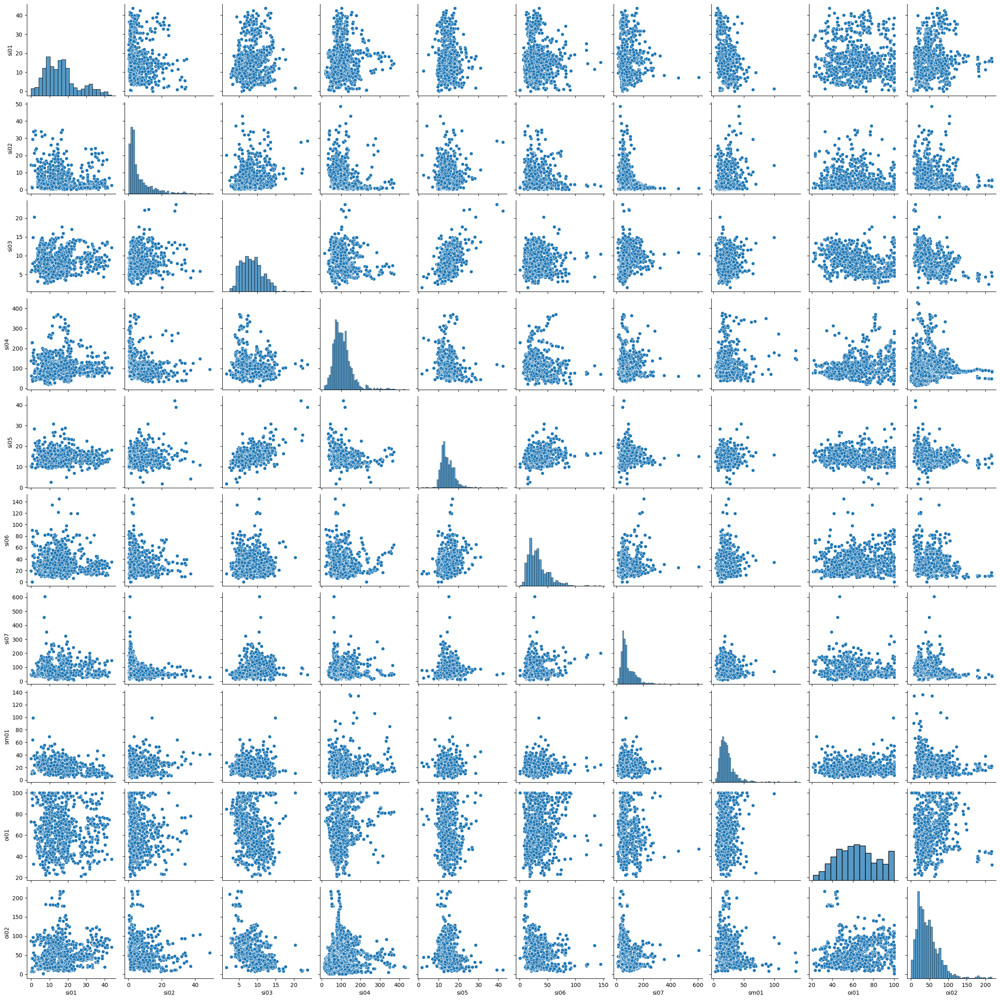

In [214]:
sns.pairplot(df1, vars = numerical_vars)

except oi01, the data is still skewed right. Therefore log transforming the data would make it better. 

### Checking Label Imabalance

In [225]:
df1['Banking Crisis'].value_counts()

Banking Crisis
0.0    1878
1.0     497
Name: count, dtype: int64

<Axes: xlabel='Banking Crisis', ylabel='count'>

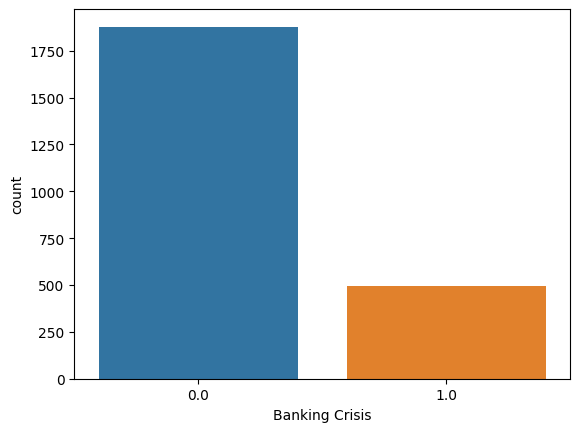

In [227]:
sns.countplot(data = df1, x ='Banking Crisis')

Therefore, we can sense a big label imbalance. 
We already have less observations after all. Therefore, we can't undersample, we will oversample instead. 

In [229]:
df_majority = df1[(df1['Banking Crisis']==0)] 
df_minority = df1[(df1['Banking Crisis']==1)] 

In [230]:
df_minority_upsampled = resample(df_minority, 
                                 replace=True,    # sample with replacement
                                 n_samples= 1878, # to match majority class
                                 random_state=42)

In [232]:
df_upsampled = pd.concat([df_minority_upsampled, df_majority])

<Axes: xlabel='Banking Crisis', ylabel='count'>

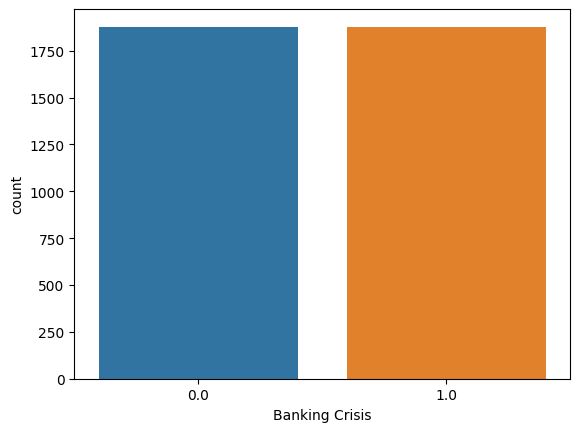

In [234]:
sns.countplot(data = df_upsampled, x ='Banking Crisis')

Now we see parity: This will help us reduce bias in results, and will help us build a less biased model. It will also help us avoid costly errors. 

### Missing Value Treatment

#### We do see a lot of missing values in our balanced label dataset. However, in a scenario like this, where the prediction of banking crisis is under study, under a lot of complex factors, and also *based on countries* to account for the causal effect:

#### It will not be wise to use traditional impuation techniques like imputation with mean on all observations. 

#### Since our data set is small, dropping all the missing values will also lead us to having a biased model or highly innacurate model

#### Our missing values here are very context specific, and based on complexed factors as captured by these variables. One possible technique is KNN imputation. It will measure the distance from the K-nearest neighbours and will lead us to have better estimated imputations. 

In [246]:
df_upsampled.isna().sum()

country                                 0
year                                    0
si01                                 2471
si02                                 2430
si03                                 2469
si04                                  329
si05                                 2432
si06                                 2481
si07                                 2577
sm01                                 1991
oi01                                 2457
oi02                                  355
Banking Crisis                          0
region_East Asia & Pacific              0
region_Europe & Central Asia            0
region_Latin America & Caribbean        0
region_Middle East & North Africa       0
region_North America                    0
region_South Asia                       0
region_Sub-Saharan Africa               0
income_High income                      0
income_Low income                       0
income_Lower middle income              0
income_Upper middle income        

In [247]:
df_upsampled.columns

Index(['country', 'year', 'si01', 'si02', 'si03', 'si04', 'si05', 'si06',
       'si07', 'sm01', 'oi01', 'oi02', 'Banking Crisis',
       'region_East Asia & Pacific', 'region_Europe & Central Asia',
       'region_Latin America & Caribbean', 'region_Middle East & North Africa',
       'region_North America', 'region_South Asia',
       'region_Sub-Saharan Africa', 'income_High income', 'income_Low income',
       'income_Lower middle income', 'income_Upper middle income'],
      dtype='object')

In [256]:
X = df_upsampled[['si01', 'si02', 'si03', 'si04', 'si05', 'si06',
       'si07', 'sm01', 'oi01', 'oi02','region_East Asia & Pacific', 'region_Europe & Central Asia',
       'region_Latin America & Caribbean', 'region_Middle East & North Africa',
       'region_North America', 'region_South Asia',
       'region_Sub-Saharan Africa', 'income_High income', 'income_Low income',
       'income_Lower middle income', 'income_Upper middle income']]
Y = df_upsampled['Banking Crisis']

In [260]:
imputer = KNNImputer(n_neighbors = 3)
X_imputed = imputer.fit_transform(X)

In [263]:
df_clean = pd.DataFrame(X_imputed, columns=X.columns, index=X.index)
df_clean['country'] = df_upsampled['country']
df_clean['year'] = df_upsampled['year']

In [264]:
df_clean

,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,...,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income,country,year
3273,12.249320,3.300000,5.500000,355.05660,16.100000,53.568460,55.000000,37.066510,80.271450,56.68361,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2009
12000,15.812637,6.500000,7.333333,55.11351,16.299999,27.849683,116.233336,55.645040,54.216693,28.92355,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Turkey,1994
9264,14.022287,17.299999,7.300000,52.40216,11.500000,43.351047,42.799999,32.431030,45.844070,16.07493,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Peru,1986
6487,14.324068,8.300000,3.900000,123.81160,10.800000,14.824263,66.599998,18.444180,61.357907,52.42258,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,"Korea, Rep.",1999
3277,18.282090,4.618144,7.049778,345.16810,19.235343,52.146820,44.036524,16.602680,81.282550,51.28306,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13256,4.590675,8.233333,6.900000,74.61155,11.533333,48.236800,42.399999,59.787820,62.262420,18.00103,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2010
13257,5.008511,3.500000,5.066667,93.14187,12.200000,37.630590,63.633334,22.308957,67.172550,20.27485,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2011
13258,5.439702,7.966667,7.233333,93.83687,13.266667,31.134950,59.966666,45.033277,62.659970,21.40109,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2012
13259,5.302338,3.500000,5.066667,93.88337,12.200000,34.719350,63.633334,22.308957,62.926860,19.93279,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2013


/Users/sunidhigoyal/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


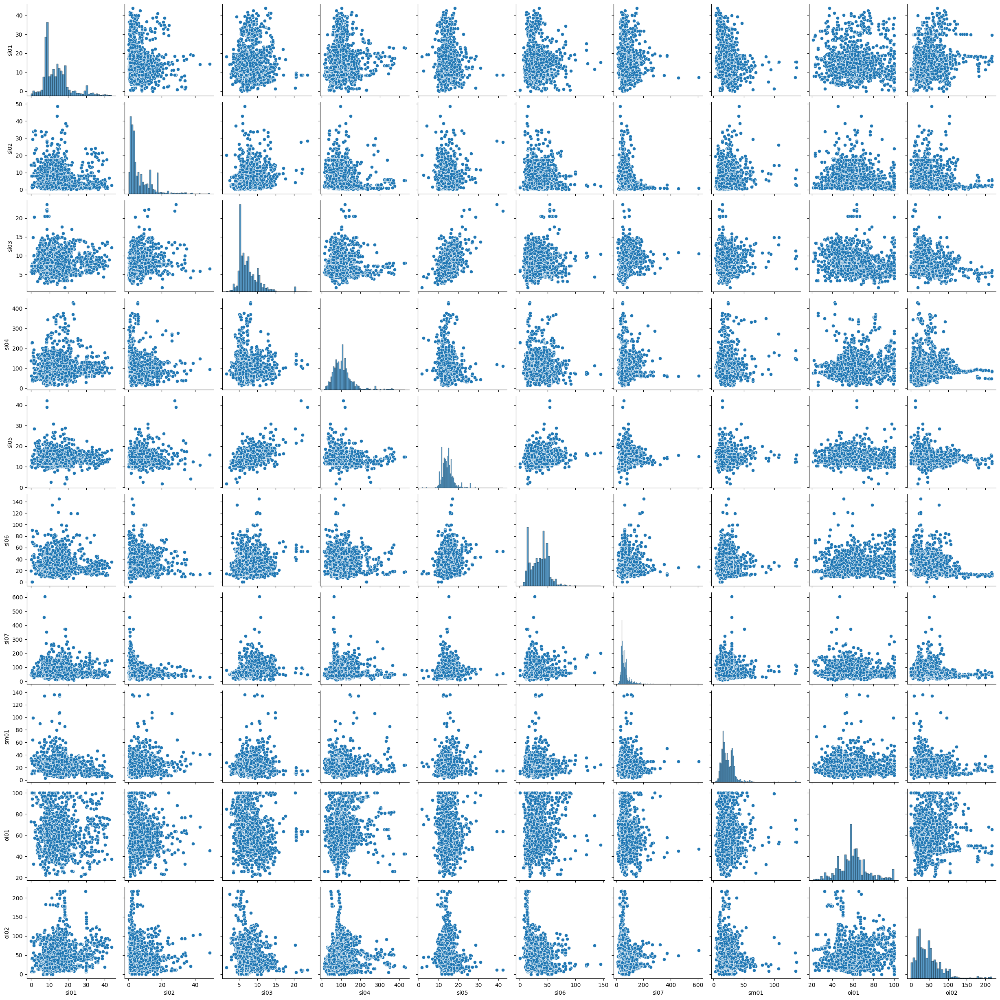

In [266]:
sns.pairplot(df_clean, vars = numerical_vars)

The data is still skewed right. Therefore log transformation would be a good idea. Except oi01 because the distribution seems scaled. 

In [267]:
df_trans = df_clean.copy()
columns_to_trans = ['si01',
 'si02',
 'si03',
 'si04',
 'si05',
 'si06',
 'si07',
 'sm01',
 'oi02']

for col in columns_to_trans:
    df_trans[col] = np.log1p(df_trans[col])

df_trans

,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,...,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income,country,year
3273,2.583946,1.458615,1.871802,5.875090,2.839078,3.999456,4.025352,3.639335,80.271450,4.054973,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2009
12000,2.822131,2.014903,2.120264,4.027377,2.850706,3.362099,4.764166,4.036804,54.216693,3.398646,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Turkey,1994
9264,2.709535,2.906901,2.116256,3.977851,2.525729,3.792136,3.779634,3.509485,45.844070,2.837611,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Peru,1986
6487,2.729425,2.230014,1.589235,4.826805,2.468100,2.761544,4.213608,2.967548,61.357907,3.978234,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,"Korea, Rep.",1999
3277,2.959177,1.726001,2.085644,5.846924,3.007431,3.973058,3.807474,2.868051,81.282550,3.956672,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13256,1.721100,2.222820,2.066863,4.325609,2.528392,3.896641,3.770459,4.107389,62.262420,2.944493,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2010
13257,1.793177,1.504077,1.802809,4.544803,2.580217,3.654044,4.168730,3.148838,67.172550,3.057526,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2011
13258,1.862482,2.193514,2.108191,4.552158,2.657926,3.469944,4.110327,3.829365,62.659970,3.109110,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2012
13259,1.840921,1.504077,1.802809,4.552648,2.580217,3.575693,4.168730,3.148838,62.926860,3.041317,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2013


/Users/sunidhigoyal/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


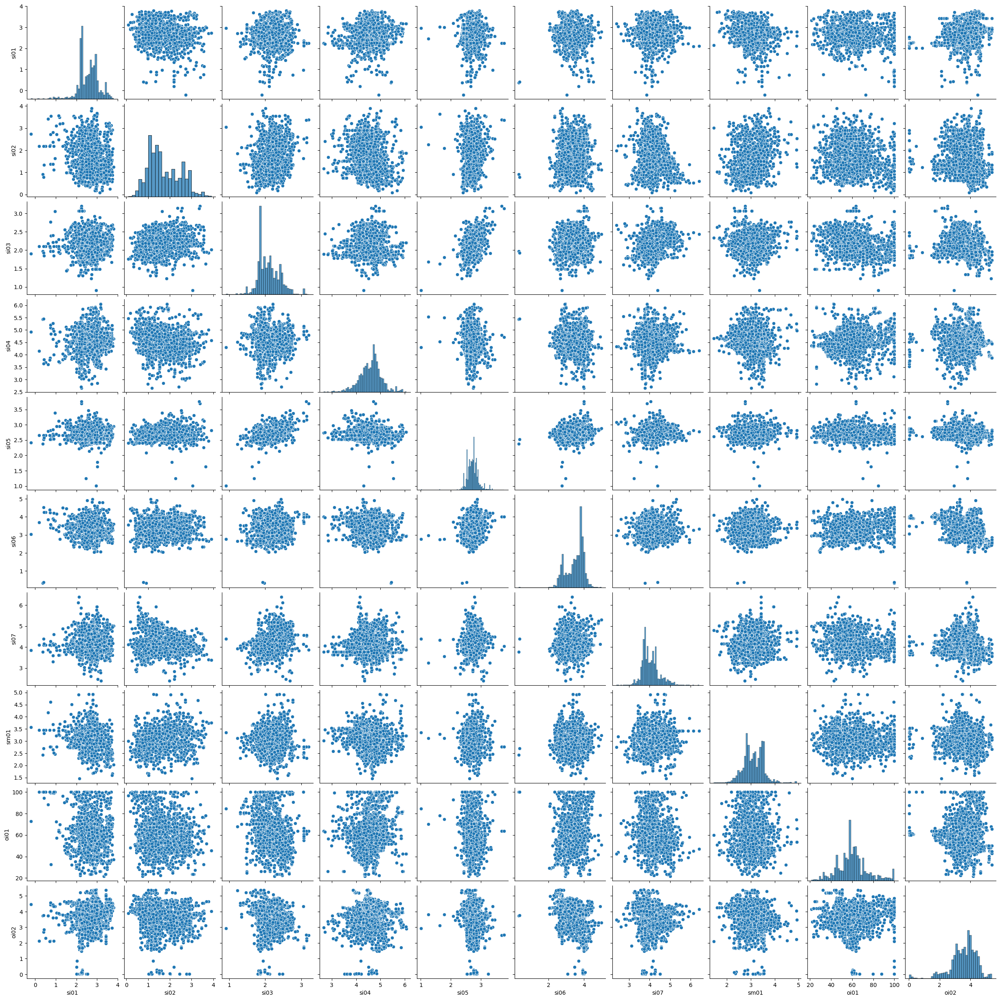

In [269]:
sns.pairplot(df_trans, vars = numerical_vars)

In [285]:
df_trans.columns

Index(['si01', 'si02', 'si03', 'si04', 'si05', 'si06', 'si07', 'sm01', 'oi01',
       'oi02', 'region_East Asia & Pacific', 'region_Europe & Central Asia',
       'region_Latin America & Caribbean', 'region_Middle East & North Africa',
       'region_North America', 'region_South Asia',
       'region_Sub-Saharan Africa', 'income_High income', 'income_Low income',
       'income_Lower middle income', 'income_Upper middle income', 'country',
       'year'],
      dtype='object')

In [289]:
cols = ['si01', 'si02', 'si03', 'si04', 'si05', 'si06', 'si07', 'sm01', 'oi01',
       'oi02', 'region_East Asia & Pacific', 'region_Europe & Central Asia',
       'region_Latin America & Caribbean', 'region_Middle East & North Africa',
       'region_North America', 'region_South Asia',
       'region_Sub-Saharan Africa', 'income_High income', 'income_Low income',
       'income_Lower middle income', 'income_Upper middle income']

### Outlier Detection

<Axes: >

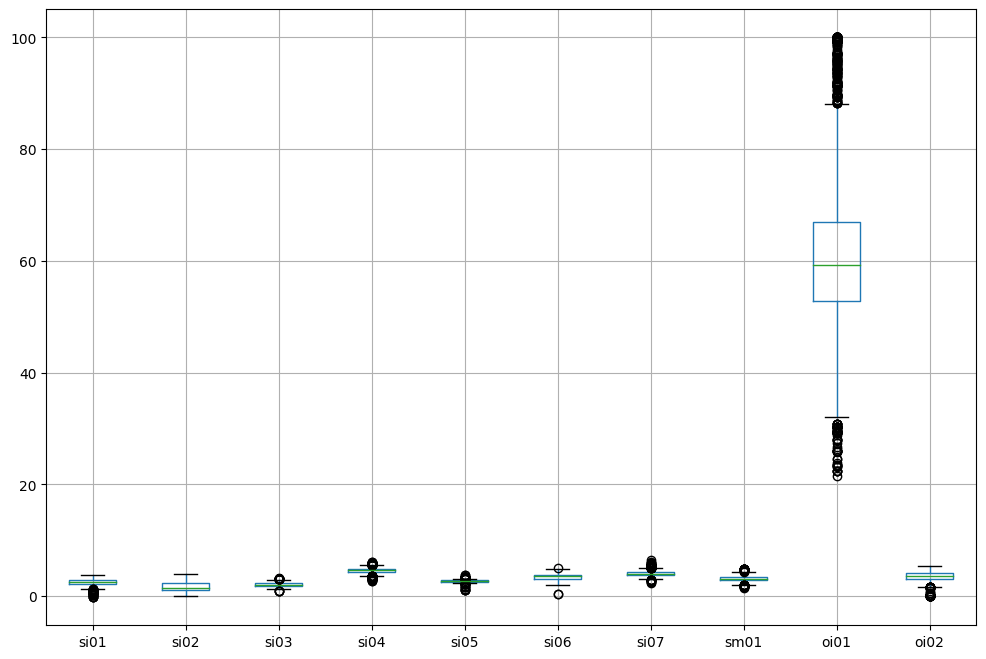

In [270]:
df_trans[numerical_vars].boxplot(figsize=(12, 8))

We do see the existence of a lot of outliers in the data. But given the dataset, the means, medians and variations are being compared with a lot of other disparate characteristics. For example, in case of Afghanistan, I see the values of si07 depleting, but if seen from 1960, it cascaded 10 times it's value on a time series, apparently because of the geopolitical and internal strife in the country. 

Therefore, it is wise to be skeptic around the outliers, and scale the data to see any betterment. 

In [286]:
X = np.atleast_2d(df_trans)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_trans[numerical_vars])
stats.describe(X_scaled)

DescribeResult(nobs=3756, minmax=(array([-5.66465211, -2.2337567 , -4.00640069, -4.26628866, -9.19975106,
       -6.42285479, -3.98913497, -4.02155595, -2.72787463, -4.32207477]), array([2.52100596, 2.99548714, 3.7914972 , 3.25796675, 5.63030223,
       3.02743889, 5.69958062, 4.37122454, 2.77841901, 2.19419126])), mean=array([ 1.81608367e-16,  1.66474336e-16,  8.47505713e-16, -8.09670636e-16,
        9.42093404e-16,  1.66474336e-16, -1.50583604e-15, -4.84288979e-16,
        2.71939612e-16, -1.92958890e-16]), variance=array([1.00026631, 1.00026631, 1.00026631, 1.00026631, 1.00026631,
       1.00026631, 1.00026631, 1.00026631, 1.00026631, 1.00026631]), skewness=array([-0.71479843,  0.469799  ,  0.52579899, -0.22267526, -0.56741203,
       -0.66434184,  0.80850405,  0.16702974,  0.47886986, -1.11009749]), kurtosis=array([ 2.86859468, -0.70410444,  0.78282191,  1.09121973, 10.40139199,
        0.1015224 ,  1.54653513,  1.0838064 ,  0.8109497 ,  2.71144868]))

In [306]:
df_trans1 = df_trans.copy()
df_trans1

,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,...,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income,country,year
3273,2.583946,1.458615,1.871802,5.875090,2.839078,3.999456,4.025352,3.639335,80.271450,4.054973,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2009
12000,2.822131,2.014903,2.120264,4.027377,2.850706,3.362099,4.764166,4.036804,54.216693,3.398646,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Turkey,1994
9264,2.709535,2.906901,2.116256,3.977851,2.525729,3.792136,3.779634,3.509485,45.844070,2.837611,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Peru,1986
6487,2.729425,2.230014,1.589235,4.826805,2.468100,2.761544,4.213608,2.967548,61.357907,3.978234,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,"Korea, Rep.",1999
3277,2.959177,1.726001,2.085644,5.846924,3.007431,3.973058,3.807474,2.868051,81.282550,3.956672,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13256,1.721100,2.222820,2.066863,4.325609,2.528392,3.896641,3.770459,4.107389,62.262420,2.944493,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2010
13257,1.793177,1.504077,1.802809,4.544803,2.580217,3.654044,4.168730,3.148838,67.172550,3.057526,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2011
13258,1.862482,2.193514,2.108191,4.552158,2.657926,3.469944,4.110327,3.829365,62.659970,3.109110,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2012
13259,1.840921,1.504077,1.802809,4.552648,2.580217,3.575693,4.168730,3.148838,62.926860,3.041317,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2013


In [307]:
scaler = StandardScaler()
df_trans1[numerical_vars] = scaler.fit_transform(df_trans1[numerical_vars])

In [308]:
df_trans1

,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,...,region_Middle East & North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income,country,year
3273,0.035841,-0.361966,-0.744514,2.837473,0.636859,1.028911,-0.036490,1.271958,1.395449,0.576806,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2009
12000,0.522279,0.401807,0.100275,-1.252029,0.699507,-0.262617,1.744143,2.234395,-0.430989,-0.219012,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Turkey,1994
9264,0.292328,1.626502,0.086647,-1.361643,-1.051377,0.608802,-0.628700,0.957537,-1.017909,-0.899284,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Peru,1986
6487,0.332948,0.697150,-1.705264,0.517329,-1.361865,-1.479569,0.417230,-0.354714,0.069610,0.483756,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,"Korea, Rep.",1999
3277,0.802165,0.005150,-0.017433,2.775135,1.543891,0.975419,-0.561602,-0.595637,1.466327,0.457613,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13256,-1.726327,0.687273,-0.081292,-0.591958,-1.037029,0.820569,-0.650812,2.405310,0.133017,-0.769687,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2010
13257,-1.579127,-0.299547,-0.979095,-0.106821,-0.757811,0.328976,0.309070,0.084263,0.477216,-0.632631,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2011
13258,-1.437586,0.647036,0.059227,-0.090542,-0.339137,-0.044081,0.168311,1.732098,0.160885,-0.570084,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2012
13259,-1.481621,-0.299547,-0.979095,-0.089457,-0.757811,0.170205,0.309070,0.084263,0.179594,-0.652285,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2013


In [310]:
df = df_trans1.copy()

/Users/sunidhigoyal/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


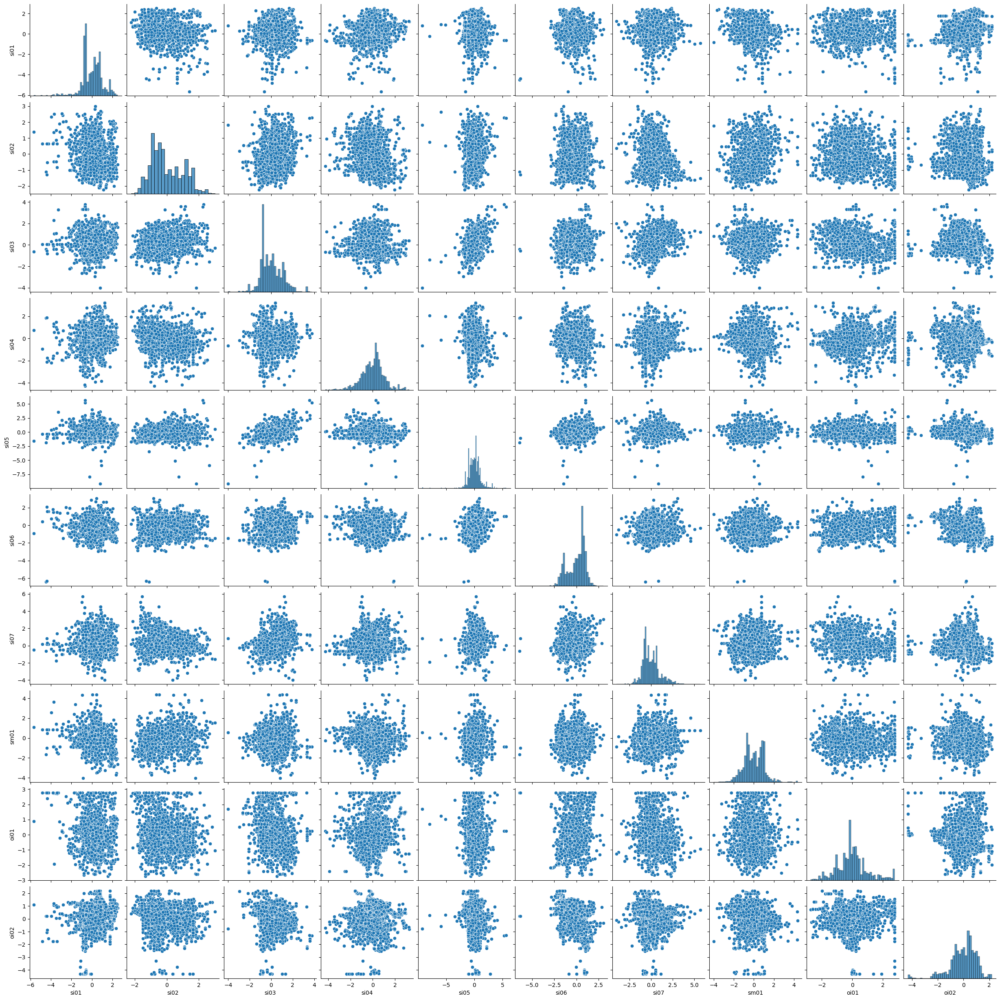

In [323]:
sns.pairplot(df, vars = numerical_vars)

We now see that the data is more scaled, centred, and more balanced in terms of greater values too. 


In the scenario of having a bigger dataset, we should have used outlier dropping techniques, but the ones which would not be based on interquartile range. I would go for something like Isolation Forest.  

## Model Development

In [356]:
df['Banking Crisis'] = df_upsampled['Banking Crisis']

In [357]:
df_train = df.copy()
df_train

,si01,si02,si03,si04,si05,si06,si07,sm01,oi01,oi02,...,region_North America,region_South Asia,region_Sub-Saharan Africa,income_High income,income_Low income,income_Lower middle income,income_Upper middle income,country,year,Banking Crisis
3273,0.035841,-0.361966,-0.744514,2.837473,0.636859,1.028911,-0.036490,1.271958,1.395449,0.576806,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2009,1.0
12000,0.522279,0.401807,0.100275,-1.252029,0.699507,-0.262617,1.744143,2.234395,-0.430989,-0.219012,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Turkey,1994,1.0
9264,0.292328,1.626502,0.086647,-1.361643,-1.051377,0.608802,-0.628700,0.957537,-1.017909,-0.899284,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Peru,1986,1.0
6487,0.332948,0.697150,-1.705264,0.517329,-1.361865,-1.479569,0.417230,-0.354714,0.069610,0.483756,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,"Korea, Rep.",1999,1.0
3277,0.802165,0.005150,-0.017433,2.775135,1.543891,0.975419,-0.561602,-0.595637,1.466327,0.457613,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Denmark,2013,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13256,-1.726327,0.687273,-0.081292,-0.591958,-1.037029,0.820569,-0.650812,2.405310,0.133017,-0.769687,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2010,0.0
13257,-1.579127,-0.299547,-0.979095,-0.106821,-0.757811,0.328976,0.309070,0.084263,0.477216,-0.632631,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2011,0.0
13258,-1.437586,0.647036,0.059227,-0.090542,-0.339137,-0.044081,0.168311,1.732098,0.160885,-0.570084,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2012,0.0
13259,-1.481621,-0.299547,-0.979095,-0.089457,-0.757811,0.170205,0.309070,0.084263,0.179594,-0.652285,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Zimbabwe,2013,0.0


In [358]:
df_train=df_train.drop(['country'],axis=1)

We can let go of the country column from the final dataset for training, because:

 The region variables and income variables capture the essence of the country's economy, and adding the name would do no benefit than added bias to the model along with more dimensions. 

In [359]:
df_train.sort_values(by='year', inplace=True)

In [360]:

train_size = 0.7  # 70% for training
test_size = 0.2   # 20% for testing
eval_size = 0.1   # 10% for evaluation

tscv = TimeSeriesSplit(n_splits=3)  

train_dfs = []
test_dfs = []
eval_dfs = []


for train_index, temp_index in tscv.split(df):
    train, temp = df.iloc[train_index], df.iloc[temp_index]
    test_index, eval_index = next(tscv.split(temp))
    train_dfs.append(train)
    test_dfs.append(temp.iloc[test_index])
    eval_dfs.append(temp.iloc[eval_index])


train_df = pd.concat(train_dfs)
test_df = pd.concat(test_dfs)
eval_df = pd.concat(eval_dfs)


X_train = train_df.drop(columns=['year', 'Banking Crisis'])
y_train = train_df['Banking Crisis']

X_test = test_df.drop(columns=['year', 'Banking Crisis'])
y_test = test_df['Banking Crisis']

X_eval = eval_df.drop(columns=['year', 'Banking Crisis'])
y_eval = eval_df['Banking Crisis']


In [367]:
X_test = X_test.drop(['country'],axis=1)
X_eval = X_eval.drop(['country'],axis=1)

### Logistic Regression Classifier

In [369]:
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)
logreg_preds = logreg_model.predict(X_test)

In [370]:
logreg_accuracy = accuracy_score(y_test, logreg_preds)
print(f"Logistic Regression Accuracy: {logreg_accuracy}")

Logistic Regression Accuracy: 0.35864978902953587


In [371]:
logreg_f1 = f1_score(y_test, logreg_preds)
print(f"Logistic Regression F1 Score: {logreg_f1}")

Logistic Regression F1 Score: 0.5086206896551724


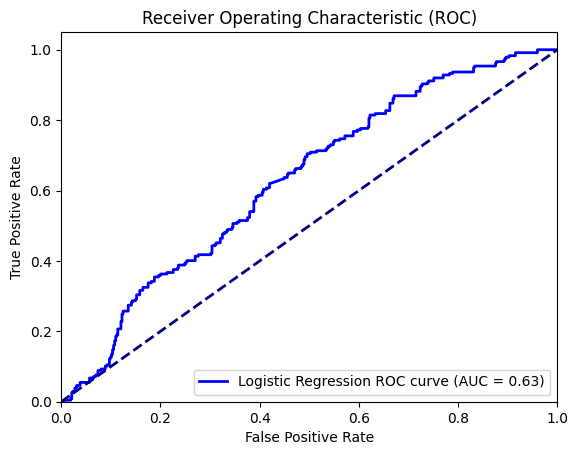

In [373]:
logreg_probs = logreg_model.predict_proba(X_test)[:, 1]
fpr_logreg, tpr_logreg, _ = roc_curve(y_test, logreg_probs)
roc_auc_logreg = auc(fpr_logreg, tpr_logreg)
plt.figure()
plt.plot(fpr_logreg, tpr_logreg, color='blue', lw=2, label=f'Logistic Regression ROC curve (AUC = {roc_auc_logreg:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [374]:
logreg_eval_preds = logreg_model.predict(X_eval)

In [376]:
logreg_eval_accuracy = accuracy_score(y_eval, logreg_eval_preds)
print(f"Logistic Regression Accuracy (Evaluation): {logreg_eval_accuracy}")
logreg_eval_f1 = f1_score(y_eval, logreg_eval_preds)
print(f"Logistic Regression F1 Score (Evaluation): {logreg_eval_f1}")

Logistic Regression Accuracy (Evaluation): 0.4017094017094017
Logistic Regression F1 Score (Evaluation): 0.5259593679458239


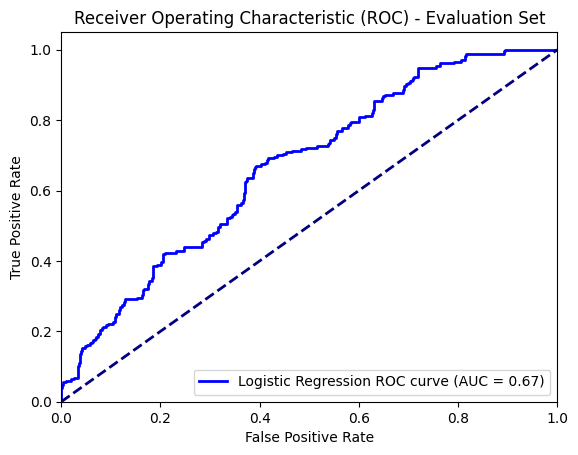

In [377]:
logreg_eval_probs = logreg_model.predict_proba(X_eval)[:, 1]
fpr_logreg_eval, tpr_logreg_eval, _ = roc_curve(y_eval, logreg_eval_probs)
roc_auc_logreg_eval = auc(fpr_logreg_eval, tpr_logreg_eval)
plt.figure()
plt.plot(fpr_logreg_eval, tpr_logreg_eval, color='blue', lw=2, label=f'Logistic Regression ROC curve (AUC = {roc_auc_logreg_eval:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Evaluation Set')
plt.legend(loc="lower right")
plt.show()

### Decision Tree Classifier

In [378]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
dt_preds = dt_model.predict(X_test)

In [380]:
dt_accuracy = accuracy_score(y_test, dt_preds)
print(f"Decision Tree Accuracy (Test): {dt_accuracy}")
dt_f1 = f1_score(y_test, dt_preds)
print(f"Decision Tree F1 Score (Test): {dt_f1}")

Decision Tree Accuracy (Test): 0.8677918424753868
Decision Tree F1 Score (Test): 0.8345070422535212


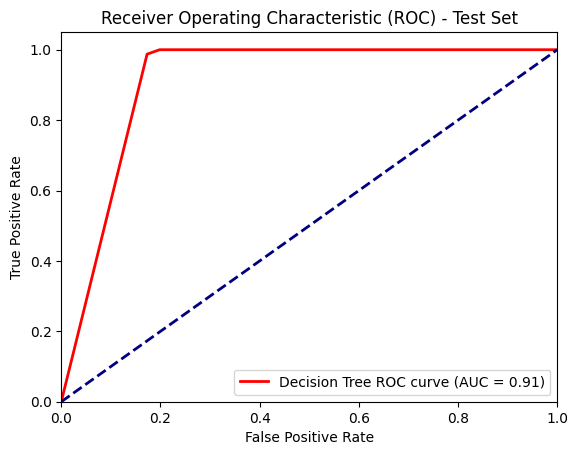

In [381]:
dt_probs = dt_model.predict_proba(X_test)[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt_probs)
roc_auc_dt = auc(fpr_dt, tpr_dt)
plt.figure()
plt.plot(fpr_dt, tpr_dt, color='red', lw=2, label=f'Decision Tree ROC curve (AUC = {roc_auc_dt:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")
plt.show()

In [382]:
dt_eval_preds = dt_model.predict(X_eval)
dt_eval_accuracy = accuracy_score(y_eval, dt_eval_preds)
print(f"Decision Tree Accuracy (Evaluation): {dt_eval_accuracy}")
dt_eval_f1 = f1_score(y_eval, dt_eval_preds)
print(f"Decision Tree F1 Score (Evaluation): {dt_eval_f1}")

Decision Tree Accuracy (Evaluation): 0.9358974358974359
Decision Tree F1 Score (Evaluation): 0.9122807017543859


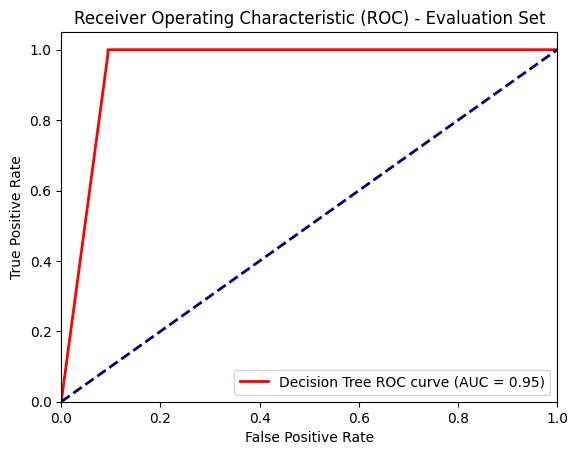

In [384]:
dt_eval_probs = dt_model.predict_proba(X_eval)[:, 1]
fpr_dt_eval, tpr_dt_eval, _ = roc_curve(y_eval, dt_eval_probs)
roc_auc_dt_eval = auc(fpr_dt_eval, tpr_dt_eval)
plt.figure()
plt.plot(fpr_dt_eval, tpr_dt_eval, color='red', lw=2, label=f'Decision Tree ROC curve (AUC = {roc_auc_dt_eval:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Evaluation Set')
plt.legend(loc="lower right")
plt.show()

### Random Forest Classifier

In [385]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

In [386]:
rf_accuracy = accuracy_score(y_test, rf_preds)
print(f"Random Forest Accuracy (Test): {rf_accuracy}")
rf_f1 = f1_score(y_test, rf_preds)
print(f"Random Forest F1 Score (Test): {rf_f1}")

Random Forest Accuracy (Test): 0.8354430379746836
Random Forest F1 Score (Test): 0.8020304568527918


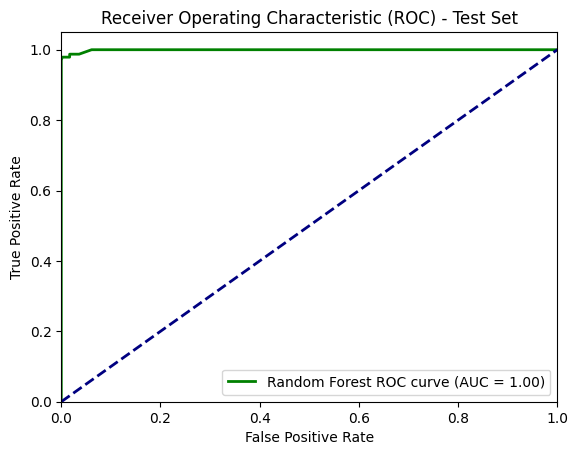

In [387]:
rf_probs = rf_model.predict_proba(X_test)[:, 1]
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probs)
roc_auc_rf = auc(fpr_rf, tpr_rf)
plt.figure()
plt.plot(fpr_rf, tpr_rf, color='green', lw=2, label=f'Random Forest ROC curve (AUC = {roc_auc_rf:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")
plt.show()

In [388]:
rf_eval_preds = rf_model.predict(X_eval)
rf_eval_accuracy = accuracy_score(y_eval, rf_eval_preds)
print(f"Random Forest Accuracy (Evaluation): {rf_eval_accuracy}")
rf_eval_f1 = f1_score(y_eval, rf_eval_preds)
print(f"Random Forest F1 Score (Evaluation): {rf_eval_f1}")

Random Forest Accuracy (Evaluation): 0.8888888888888888
Random Forest F1 Score (Evaluation): 0.8571428571428571


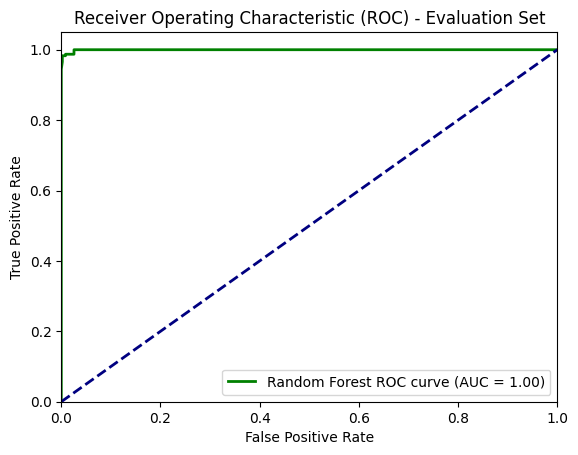

In [389]:
rf_eval_probs = rf_model.predict_proba(X_eval)[:, 1]
fpr_rf_eval, tpr_rf_eval, _ = roc_curve(y_eval, rf_eval_probs)
roc_auc_rf_eval = auc(fpr_rf_eval, tpr_rf_eval)
plt.figure()
plt.plot(fpr_rf_eval, tpr_rf_eval, color='green', lw=2, label=f'Random Forest ROC curve (AUC = {roc_auc_rf_eval:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Evaluation Set')
plt.legend(loc="lower right")
plt.show()

### Support Vector Machine Model

In [390]:
svm_model = SVC(kernel='linear', probability=True)
svm_model.fit(X_train, y_train)
svm_preds = svm_model.predict(X_test)

In [391]:
svm_accuracy = accuracy_score(y_test, svm_preds)
print(f"SVM Accuracy (Test): {svm_accuracy}")
svm_f1 = f1_score(y_test, svm_preds)
print(f"SVM F1 Score (Test): {svm_f1}")

SVM Accuracy (Test): 0.3333333333333333
SVM F1 Score (Test): 0.5


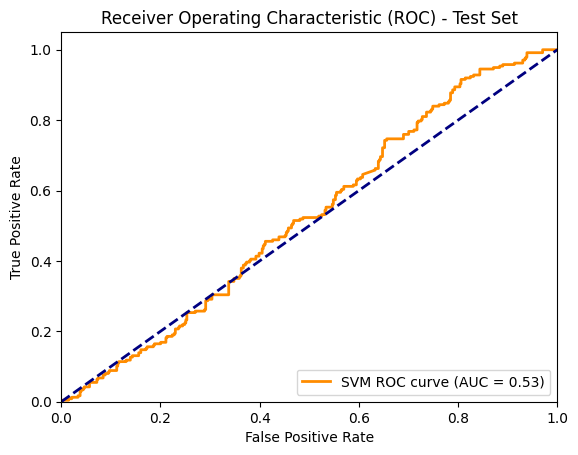

In [392]:
svm_probs = svm_model.predict_proba(X_test)[:, 1]
fpr_svm, tpr_svm, _ = roc_curve(y_test, svm_probs)
roc_auc_svm = auc(fpr_svm, tpr_svm)
plt.figure()
plt.plot(fpr_svm, tpr_svm, color='darkorange', lw=2, label=f'SVM ROC curve (AUC = {roc_auc_svm:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")
plt.show()

In [393]:
svm_eval_preds = svm_model.predict(X_eval)
svm_eval_accuracy = accuracy_score(y_eval, svm_eval_preds)
print(f"SVM Accuracy (Evaluation): {svm_eval_accuracy}")
svm_eval_f1 = f1_score(y_eval, svm_eval_preds)
print(f"SVM F1 Score (Evaluation): {svm_eval_f1}")

SVM Accuracy (Evaluation): 0.3333333333333333
SVM F1 Score (Evaluation): 0.5


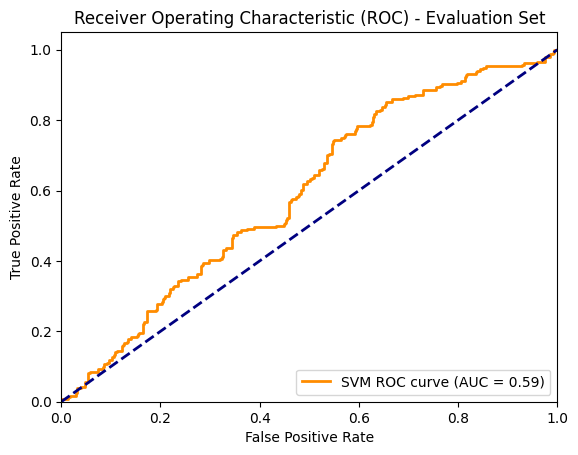

In [394]:
svm_eval_probs = svm_model.predict_proba(X_eval)[:, 1]
fpr_svm_eval, tpr_svm_eval, _ = roc_curve(y_eval, svm_eval_probs)
roc_auc_svm_eval = auc(fpr_svm_eval, tpr_svm_eval)
plt.figure()
plt.plot(fpr_svm_eval, tpr_svm_eval, color='darkorange', lw=2, label=f'SVM ROC curve (AUC = {roc_auc_svm_eval:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Evaluation Set')
plt.legend(loc="lower right")
plt.show()

###  AdaBoost Model

In [402]:
ada_model = AdaBoostClassifier()
ada_model.fit(X_train, y_train)
ada_preds = ada_model.predict(X_test)

In [403]:
ada_accuracy = accuracy_score(y_test, ada_preds)
print(f"AdaBoost Accuracy (Test): {ada_accuracy}")
ada_f1 = f1_score(y_test, ada_preds)
print(f"AdaBoost F1 Score (Test): {ada_f1}")

AdaBoost Accuracy (Test): 0.4641350210970464
AdaBoost F1 Score (Test): 0.5480427046263345


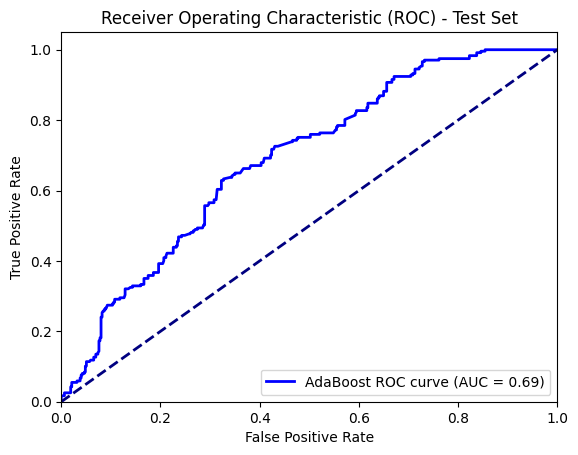

In [404]:
ada_probs = ada_model.predict_proba(X_test)[:, 1]
fpr_ada, tpr_ada, _ = roc_curve(y_test, ada_probs)
roc_auc_ada = auc(fpr_ada, tpr_ada)
plt.figure()
plt.plot(fpr_ada, tpr_ada, color='blue', lw=2, label=f'AdaBoost ROC curve (AUC = {roc_auc_ada:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Test Set')
plt.legend(loc="lower right")
plt.show()

In [405]:
ada_eval_preds = ada_model.predict(X_eval)
ada_eval_accuracy = accuracy_score(y_eval, ada_eval_preds)
print(f"AdaBoost Accuracy (Evaluation): {ada_eval_accuracy}")
ada_eval_f1 = f1_score(y_eval, ada_eval_preds)
print(f"AdaBoost F1 Score (Evaluation): {ada_eval_f1}")

AdaBoost Accuracy (Evaluation): 0.46153846153846156
AdaBoost F1 Score (Evaluation): 0.5521327014218009


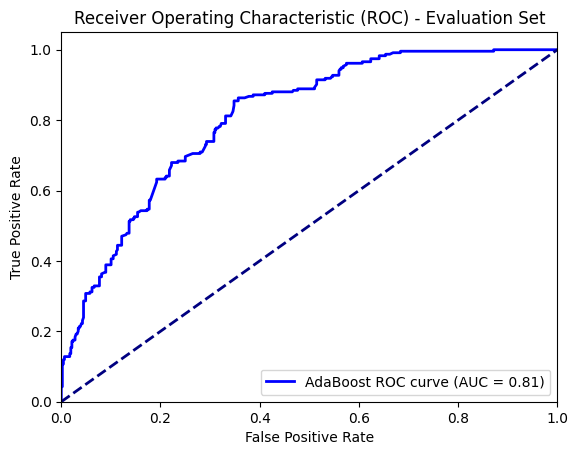

In [406]:
ada_eval_probs = ada_model.predict_proba(X_eval)[:, 1]
fpr_ada_eval, tpr_ada_eval, _ = roc_curve(y_eval, ada_eval_probs)
roc_auc_ada_eval = auc(fpr_ada_eval, tpr_ada_eval)
plt.figure()
plt.plot(fpr_ada_eval, tpr_ada_eval, color='blue', lw=2, label=f'AdaBoost ROC curve (AUC = {roc_auc_ada_eval:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Evaluation Set')
plt.legend(loc="lower right")
plt.show()

### Model Performance Comparision

In [409]:
models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'AdaBoost']
accuracies_test = [logreg_accuracy, dt_accuracy, rf_accuracy, svm_accuracy, ada_accuracy]
f1_scores_test = [logreg_f1, dt_f1, rf_f1, svm_f1, ada_f1]
accuracies_eval = [logreg_eval_accuracy, dt_eval_accuracy, rf_eval_accuracy, svm_eval_accuracy, ada_eval_accuracy]
f1_scores_eval = [logreg_eval_f1, dt_eval_f1, rf_eval_f1, svm_eval_f1, ada_eval_f1]

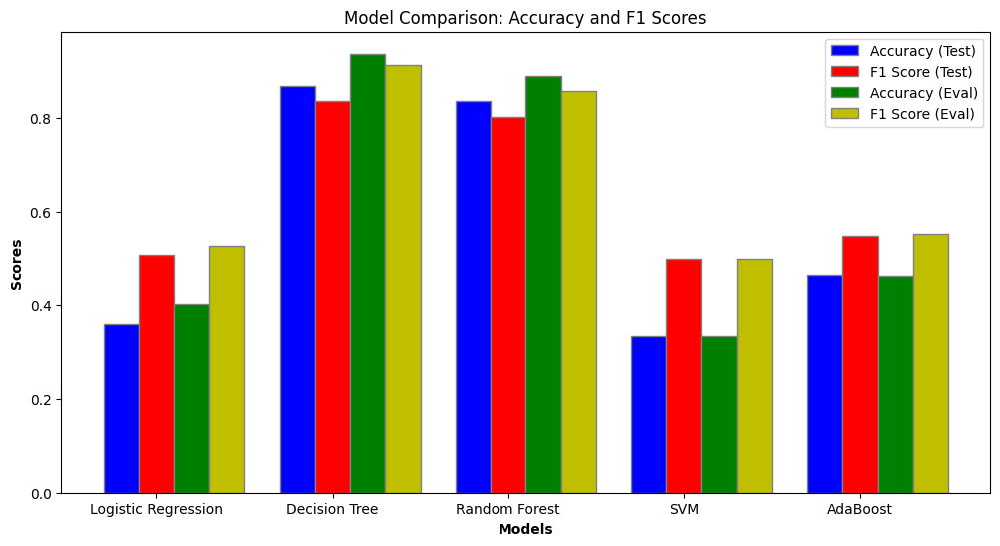

In [410]:
bar_width = 0.2

r1 = np.arange(len(models))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

plt.figure(figsize=(12, 6))

plt.bar(r1, accuracies_test, color='b', width=bar_width, edgecolor='grey', label='Accuracy (Test)')
plt.bar(r2, f1_scores_test, color='r', width=bar_width, edgecolor='grey', label='F1 Score (Test)')

plt.bar(r3, accuracies_eval, color='g', width=bar_width, edgecolor='grey', label='Accuracy (Eval)')
plt.bar([x + bar_width for x in r3], f1_scores_eval, color='y', width=bar_width, edgecolor='grey', label='F1 Score (Eval)')

plt.xlabel('Models', fontweight='bold')
plt.ylabel('Scores', fontweight='bold')
plt.xticks([r + bar_width for r in range(len(models))], models)
plt.title('Model Comparison: Accuracy and F1 Scores')
plt.legend()

plt.show()

## Comparing all metrics, the decision tree model performs the best. It should be noted, that accuracy is not a good metric to rely on, in the case we are dealing with. The F1 score and ROC curves are. 

## The reason behind it is because, in terms of our context, detection of financial crisis, we want to avoid false negatives and need our model to be sensitive, because not detecting an impending financial crisis and denying it would lead to a disaster in terms of no action. Our decision tree model gives a good F1 score and an ROC which is good enough, therefore Decision Tree is the model we will go with. 